# Garbage Classification Using Convolutional Neural Networks (CNN)

Authors:
- Arnaud Guzman-Annes
- Jake Hogan
- Sophie Courtemanche-Martel
- Duncan Wang

</br>

For the purposes of this project, the data has been already split into two folders: training and validation. Each of these folders contains sub-folders of the following classes of garbage: glass, paper, cardboard, plastic, metal, trash. Thus, each image within is respective folder has been manually identified, sorted into a folder representing its respective category. Note that all images are stored in and retrieved from our Google Cloud Platform (GCP) bucket.

</br>

## Step 1: Load and Process Images


In this step, we will load images of garbage from the train and test folders and transform the images into array format, which is required for input into the CNN model. Before transforming the images into arrays, we will also introduce some randomness to the process -- such as flipping or cropping the images into various sizes.  This process helps augment the data by increasing the data variety and preventing overfitting on the training dataset. We will store the arrays in lists for later retrieval. 

*Be sure to change runtime type to GPU if on Google Colab*

In [1]:
import math
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
import os

import warnings
warnings.filterwarnings("ignore")

#### 1.1: Connect to GCP Bucket

In [2]:
#making OS directories to put the contents of the project
if not os.path.exists('/content/garbage_classifier'):
  os.mkdir('/content/garbage_classifier')
if not os.path.exists('/content/garbage_classifier/test'):
  os.mkdir('/content/garbage_classifier/test')
if not os.path.exists('/content/garbage_classifier/train'):
  os.mkdir('/content/garbage_classifier/train')
  
MAIN_DIR = '/content/garbage_classifier' #the main directory of this project

In [3]:
#reading in the files required for image imports
os.chdir(os.path.join(MAIN_DIR, 'test'))
!wget https://storage.googleapis.com/ai-project-315815-bucket/garbage_images/test_files.csv
os.chdir(os.path.join(MAIN_DIR, 'train'))
!wget https://storage.googleapis.com/ai-project-315815-bucket/garbage_images/train_files.csv

--2021-06-06 18:22:32--  https://storage.googleapis.com/ai-project-315815-bucket/garbage_images/test_files.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.101.128, 142.250.141.128, 2607:f8b0:4023:c06::80, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.101.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10798 (11K) [text/csv]
Saving to: ‘test_files.csv’

test_files.csv      100%[===================>]  10.54K  --.-KB/s    in 0s      

2021-06-06 18:22:32 (80.1 MB/s) - ‘test_files.csv’ saved [10798/10798]

--2021-06-06 18:22:32--  https://storage.googleapis.com/ai-project-315815-bucket/garbage_images/train_files.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.101.128, 142.250.141.128, 2607:f8b0:4023:c06::80, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.101.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 41751 (41K) [text/csv]

#### 1.2: Load Images

*This step may take 3-4 minutes*

In [ ]:
from IPython.utils import io

file_names = pd.read_csv(os.path.join(MAIN_DIR, 'test/test_files.csv'))

for label in file_names.label.unique().tolist():
  if not os.path.exists(os.path.join(MAIN_DIR, 'test', label)):
    os.mkdir(os.path.join(os.path.join(MAIN_DIR, 'test', label))) #create a folder for each class in the test directory
  os.chdir(os.path.join(MAIN_DIR, 'test', label)) #access each of those folders
  files_to_read = file_names[file_names['label'] == label] #filter the files to read for that folder
  for file_name in files_to_read['file_name'].tolist():
    url = 'https://storage.googleapis.com/ai-project-315815-bucket/garbage_images/test/'+label+'/'+file_name #wget each file from GCS bucket
    with io.capture_output() as captured:
      !wget $url

In [ ]:
file_names = pd.read_csv(os.path.join(MAIN_DIR, 'train/train_files.csv'))

for label in file_names.label.unique().tolist():
  if not os.path.exists(os.path.join(MAIN_DIR, 'train', label)):
    os.mkdir(os.path.join(os.path.join(MAIN_DIR, 'train', label))) #create a folder for each class in the train directory
  os.chdir(os.path.join(MAIN_DIR, 'train', label)) #access each of those folders
  files_to_read = file_names[file_names['label'] == label] #filter the files to read for that folder
  if len(os.listdir(os.path.join(os.path.join(MAIN_DIR, 'train', label)))) < len(files_to_read): #only read in images if they aren't already there
    for file_name in files_to_read['file_name'].tolist():
      url = 'https://storage.googleapis.com/ai-project-315815-bucket/garbage_images/train/'+label+'/'+file_name #wget each file from GCS bucket
      with io.capture_output() as captured:
        !wget $url

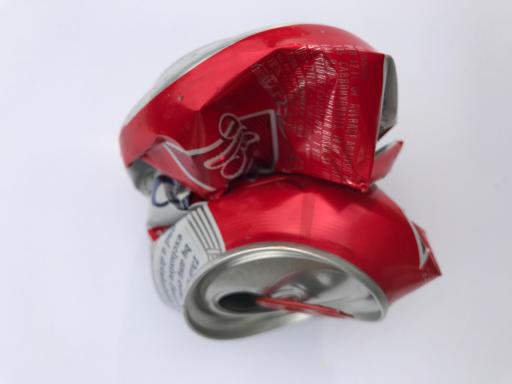

In [ ]:
#load a single image as a test 
from keras.preprocessing import image
test_image = image.load_img('/content/garbage_classifier/test/metal/metal246.jpg')
test_image

In [ ]:
#load image and transform to 3D array - image array shape is 384 x 512 pixels, colour channels = 3 (RGB)
img_array = image.img_to_array(test_image)
#process for transforming an image to an array -- one way to do it 
img_array = keras.applications.xception.preprocess_input(img_array)
img_array.shape

(384, 512, 3)

#### 1.3: Augment images through random cropping & flipping

In [59]:
#center crop of incoming image, sizing it down to (224, 224, 3)
def center_crop(img):
  image_array = image.img_to_array(img)
  shape = image_array.shape # H, W, D
  left = int((shape[1]-224)/2)
  right = left + 224
  bottom = int((shape[0]-224)/2)
  top = bottom + 224
  return image_array[bottom:top, left:right]

#random crop of the image within the defined range
def random_crop(img):
  image_array = image.img_to_array(img)
  shape = image_array.shape
  left = np.random.randint(0, shape[1]-224)
  right = left + 224
  bottom = np.random.randint(0, shape[0]-224)
  top = bottom + 224
  return image_array[bottom:top, left:right]

#with some randomness, either center crop or random crop the image, as well as either flip or do not flip the image.
def process_img(img):

  if np.random.rand() > 0.5:
    cropped = center_crop(img)
    if np.random.rand() > 0.5:
      return np.flip(cropped, axis=np.random.randint(0, 2))
    else:
      return cropped
  else:
    cropped = random_crop(img)
    if np.random.rand() > 0.5:
      return np.flip(cropped, axis=np.random.randint(0, 2))
    else:
      return cropped

In [56]:
#Augmentation Example
from keras_preprocessing import image
os.chdir(MAIN_DIR)
!wget https://storage.googleapis.com/ai-project-315815-bucket/garbage_images/test/plastic/plastic130.jpg

--2021-06-06 19:02:16--  https://storage.googleapis.com/ai-project-315815-bucket/garbage_images/test/plastic/plastic130.jpg
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.101.128, 142.250.141.128, 2607:f8b0:4023:c06::80, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.101.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10109 (9.9K) [image/jpeg]
Saving to: ‘plastic130.jpg.3’

plastic130.jpg.3    100%[===================>]   9.87K  --.-KB/s    in 0s      

2021-06-06 19:02:16 (103 MB/s) - ‘plastic130.jpg.3’ saved [10109/10109]



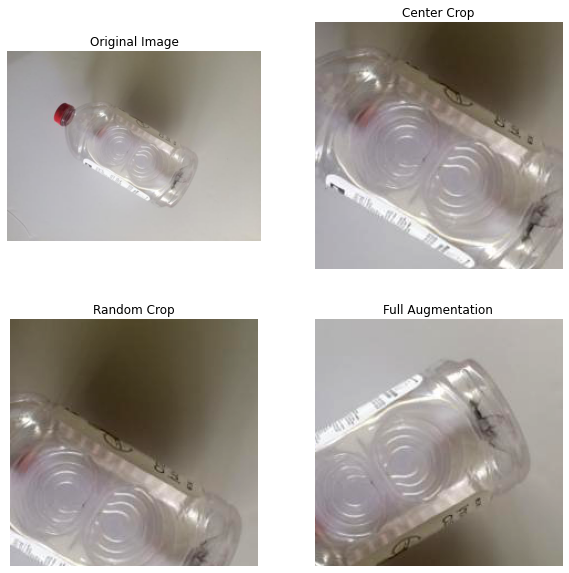

In [89]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
test_image = image.load_img('/content/garbage_classifier/plastic130.jpg')
center_cropped_test = image.array_to_img(center_crop(test_image))
random_cropped_test = image.array_to_img(random_crop(test_image))
processed_test = image.array_to_img(keras.applications.xception.preprocess_input(process_img(test_image)))

fig, ax = plt.subplots(2, 2)
fig.set_figheight(10)
fig.set_figwidth(10)

ax[0, 0].imshow(test_image)
ax[0, 0].set_title('Original Image')
ax[0, 0].axis('off')

ax[0, 1].imshow(center_cropped_test)
ax[0, 1].set_title('Center Crop')
ax[0, 1].axis('off')

ax[1, 0].imshow(random_cropped_test)
ax[1, 0].set_title('Random Crop')
ax[1, 0].axis('off')

ax[1, 1].imshow(processed_test)
ax[1, 1].set_title('Full Augmentation')
ax[1, 1].axis('off')

plt.show()

**Note:** The original image is shape differently because when fed into the models, the image shape is intended to be (224, 224, 3), but the default image is (384, 512, 3).

In [ ]:
TEST_PATH = os.path.join(MAIN_DIR, 'test')
TRAIN_PATH = os.path.join(MAIN_DIR, 'train')

#create lists to write processed images into 
X_valid_list = []
y_valid_list = []

X_train_list = []
y_train_list = []

folder_names = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

#connect to test image folder
for folder in folder_names:
  FOLDER_PATH = os.path.join(TEST_PATH, folder)
  for im in os.listdir(FOLDER_PATH):
    #load image and transform to array
    img = image.load_img(os.path.join(TEST_PATH, folder, im))
    img_array = process_img(img)
    processed_img = keras.applications.xception.preprocess_input(img_array)
    #append processed image to new list
    X_valid_list.append(list(processed_img))
    #append label of processed image to new list
    y_valid_list += [folder]

    if len(y_valid_list)%50 == 0:
      print(len(y_valid_list), 'images loaded into test')

#connect to train image folder 
for folder in folder_names:
  FOLDER_PATH = os.path.join(TRAIN_PATH, folder)
  for im in os.listdir(FOLDER_PATH):
    #load image and transform to array
    img = image.load_img(os.path.join(TRAIN_PATH, folder, im))
    img_array = process_img(img)
    processed_img = keras.applications.xception.preprocess_input(img_array)
    #append processed image to new list 
    X_train_list.append(list(processed_img))
    #append label of processed image to new list 
    y_train_list += [folder] 

    if len(y_train_list)%50 == 0:
      print(len(y_train_list), 'images loaded into train')

50 images loaded into test
100 images loaded into test
150 images loaded into test
200 images loaded into test
250 images loaded into test
300 images loaded into test
350 images loaded into test
400 images loaded into test
450 images loaded into test
500 images loaded into test
550 images loaded into test
600 images loaded into test
650 images loaded into test
700 images loaded into test
750 images loaded into test
800 images loaded into test
850 images loaded into test
900 images loaded into test
950 images loaded into test
1000 images loaded into test
50 images loaded into train
100 images loaded into train
150 images loaded into train
200 images loaded into train
250 images loaded into train
300 images loaded into train
350 images loaded into train
400 images loaded into train
450 images loaded into train
500 images loaded into train
550 images loaded into train
600 images loaded into train
650 images loaded into train
700 images loaded into train
750 images loaded into train
800 im

**Alternative Image Ingestion:** Instead of reading all the images in at once, it's also possible to use an `ImageDataGenerator` which reads images in batches and passes them to the model for training, then frees up memory and repeats with the next batch. This method is helpful for models with high volumes of data, but in our case the set of images was relatively small, so we felt it easier to read all the images in at once, then train the model. 

The `ImageDataGenerator` allows for data augmentation to happen as images are being read in, and the `flow_from_directory` method directs the generator to the source of images.

In [ ]:
#ALTERNATIVE IMAGE INGESTION METHOD

train_generator = image.ImageDataGenerator(rescale=1./255, horizontal_flip=True, preprocessing_function=keras.applications.xception.preprocess_input, shear_range=0.2, height_shift_range=0.2, zoom_range=0.2, validation_split=0.2)
train_set = train_generator.flow_from_directory(IMAGES_PATH, target_size=(224, 224), subset='training')
valid_set = train_generator.flow_from_directory(IMAGES_PATH, target_size=(224, 224), subset='validation')

## Step 2: EDA <br>
For this section, we will do an exploratory data analysis for the different images available. First, let's look at the amount of images per category. Also, let's take a closer look at each category, and also examine what the original photos look like.

In [ ]:
# Import libraries for EDA

import seaborn as sb
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Setting default fig size
size_ = (10,8)

In [ ]:
os.chdir(MAIN_DIR)
!wget https://storage.googleapis.com/ai-project-315815-bucket/garbage_images/one-indexed-files.txt

--2021-06-06 17:40:56--  https://storage.googleapis.com/ai-project-315815-bucket/garbage_images/one-indexed-files.txt
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.31.128, 172.217.8.16, 172.217.7.240, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.31.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 39832 (39K) [text/plain]
Saving to: ‘one-indexed-files.txt’

one-indexed-files.t 100%[===================>]  38.90K  --.-KB/s    in 0s      

2021-06-06 17:40:56 (137 MB/s) - ‘one-indexed-files.txt’ saved [39832/39832]



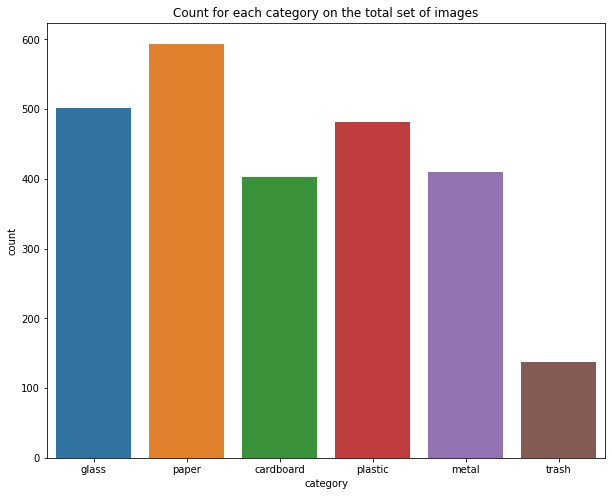

In [ ]:
category = []
filename = []

#view number of images in each item class
with open('/content/garbage_classifier/one-indexed-files.txt', 'r') as file:
    for line in file:     
        cat = ''.join([i for i in line.split('.')[0] if not i.isdigit()])
        category.append(cat)
        filename.append(cat+"/"+line.split(' ')[0])
df = pd.DataFrame({
    'filename':filename,
    'category': category,
})

fig = plt.subplots(figsize=size_)
plt.title('Count for each category on the total set of images')
sb.countplot(x = df['category'], data=df)

In [ ]:
# Distribution of labels in the training set 
labels = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

for label in labels:
    directory = os.path.join(TRAIN_PATH, label)
    print("Images of label \"" + label + "\":\t", len(os.listdir(directory)))

Images of label "cardboard":	 317
Images of label "glass":	 393
Images of label "metal":	 328
Images of label "paper":	 476
Images of label "plastic":	 384
Images of label "trash":	 111


In [ ]:
# Distribution of labels in the test set 
for label in labels:
    directory = os.path.join(TEST_PATH, label)
    print("Images of label \"" + label + "\":\t", len(os.listdir(directory)))

Images of label "cardboard":	 172
Images of label "glass":	 216
Images of label "metal":	 164
Images of label "paper":	 236
Images of label "plastic":	 196
Images of label "trash":	 52


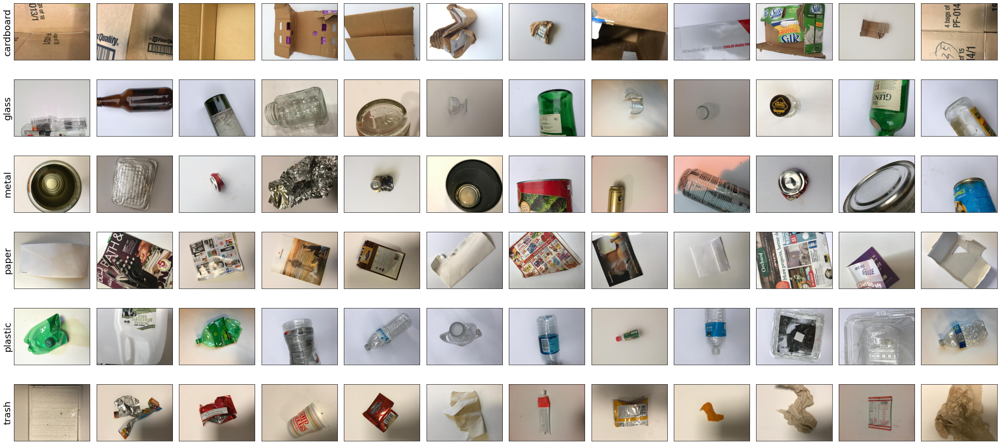

In [ ]:
# Image visualization
plt.figure(figsize=(30,14))

for i in range(6):
    directory = os.path.join(TRAIN_PATH, labels[i])
    for j in range(12):
        path = os.path.join(directory, os.listdir(directory)[j])
        img = mpimg.imread(path)
        
        plt.subplot(6, 12, i*12 + j + 1)
        plt.imshow(img)
        
        if j == 0:
            plt.ylabel(labels[i], fontsize=20)
        
plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[]);
plt.tight_layout()
plt.show()

## Step 3: Preprocess & Split Data

Here, we further clean and split the datasets to prepare the appropriate inputs into the CNN model.

In [ ]:
#transform X variables to floats
X_train_full = np.array(X_train_list).astype(np.float32)
X_valid = np.array(X_valid_list).astype(np.float32)
print(X_train_full.shape)
print(X_valid.shape)

(2009, 224, 224, 3)
(1036, 224, 224, 3)


In [ ]:
#factorize Y variables from words to categories
y_train_full, y_train_keys = pd.factorize(y_train_list)[0].reshape(-1, 1).astype(np.float32), pd.factorize(y_train_list)[1]
y_valid, y_valid_keys = pd.factorize(y_valid_list)[0].reshape(-1, 1).astype(np.float32), pd.factorize(y_valid_list)[1]

train_labels = {i: y_train_keys[i] for i in range(len(y_train_keys))}
valid_labels = {i: y_valid_keys[i] for i in range(len(y_valid_keys))}

print(y_train_full.shape)
print(y_valid.shape)

(2009, 1)
(1036, 1)


In [ ]:
#result of factorization
print(y_valid_list[:5])
print(y_valid[:5])

['cardboard', 'cardboard', 'cardboard', 'cardboard', 'cardboard']
[[0.]
 [0.]
 [0.]
 [0.]
 [0.]]


In [ ]:
#identify index corresponding to each item type 
print(y_valid[y_valid_list.index('cardboard')])
print(y_valid[y_valid_list.index('glass')])
print(y_valid[y_valid_list.index('metal')])
print(y_valid[y_valid_list.index('paper')])
print(y_valid[y_valid_list.index('plastic')])
print(y_valid[y_valid_list.index('trash')])


[0.]
[1.]
[2.]
[3.]
[4.]
[5.]


In [ ]:
#clear unused variables to save RAM 
X_valid_list, X_train_list, y_valid_list, y_train_list = [], [], [], []

In [ ]:
#shuffle the data around as we can see that the orders of each category of items are currently sequential 

valid_shuffler = np.random.permutation(len(X_valid))
X_valid = X_valid[valid_shuffler]
y_valid = y_valid[valid_shuffler]

train_full_shuffler = np.random.permutation(len(X_train_full))
X_train_full = X_train_full[train_full_shuffler]
y_train_full = y_train_full[train_full_shuffler]

In [ ]:
#split the full training datasets into a separate train and test set; this ensures that we have train, validation, and test sets available. 
#we will train the model on the train & validation datasets only and then assess its performance on the test set
test_size = int(len(y_valid)/2)
X_train, X_test = X_train_full[:-test_size], X_train_full[-test_size:]
y_train, y_test = y_train_full[:-test_size], y_train_full[-test_size:]

print(y_train.shape)
print(y_valid.shape)
print(y_test.shape)

(1491, 1)
(1036, 1)
(518, 1)


## Step 4: Build CNN Model

#### 4.1 Transfer Learning: Create a Base Pre-Trained Model

Here, we import a pre-trained model to use as the base model of our CNN network. Known as transfer learning, this is beneficial since our dataset may not have enough images of garbage to train a full-fledged model off of. In this case, we can take features learned from a pre-trained model and apply them to identify types of garbage, so that our model does not have to start learning from scratch. Since we do not have a pre-trained garbage-classifier specifically, we use the "ImageNet" model instead, which is trained on a large collection of different items and could be useful for identifying garbage items.


In short, transfer learning allows us to: 

1. Instantiate a base model and load pre-trained weights onto it
2. Freeze all layers in the base model and create a new model on top
3. Train the new model on our garbage dataset.

In [ ]:
base_model = keras.applications.xception.Xception(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

83689472/83683744 [==============================] - 0s 0us/step


#### 4.2: Build a CNN

Here, we create a Sequential model and add our pre-trained ImageNet model, as well as several other layers.

In [ ]:
#freeze the base model 
base_model.trainable = False

#define the type of NN architecture - sequential model specifies a linear stack of layers 
model = keras.models.Sequential()

#add the pre-trained model
model.add(base_model)

#pool layer to prepare data as input into dense layer 
model.add(keras.layers.GlobalAveragePooling2D())
model.add(keras.layers.Dense(256, activation='relu'))
#batch normalization layer re-centers and re-scales the network - helps accelerate training
model.add(keras.layers.BatchNormalization())
#dropout layer - temporarily deactivates 20% of the nodes in the network each epoch to redistribute weights/help network concentrate on "weak" features and prevent overfitting
model.add(keras.layers.Dropout(0.2))
#flatten layer to single array for input into dense layer 
model.add(keras.layers.Flatten())
# prediction layer - 6 neurons = 6 category outputs, and softmax to normalize the output of the network to a probability distribution over the predicted output classes 
model.add(keras.layers.Dense(6, activation='softmax'))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Functional)        (None, 7, 7, 2048)        20861480  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               524544    
_________________________________________________________________
batch_normalization_4 (Batch (None, 256)               1024      
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
flatten (Flatten)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 6)                 1

In [ ]:
#compile model, specify sparse categorical crossentropy for classification and evaluate accuracy
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

#### 4.3: Implement Custom Callback functions 

Here, we implement two custom callback functions to use when training the model. The first callback creates a custom function which stops training if training accuracy is over 0.999, to prevent overfitting. The second callback logs model statistics which we can view later on to review the training progress.

In [ ]:
# implementing a custom callback to stop training if we reach accuracy >0.999 because that indicates overfitting on this relatively small dataset
class OverfittingCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if logs.get('accuracy') > 0.999:
      self.model.stop_training = True
      print('Trying to prevent overfitting - stopping training')

In [ ]:
#TensorBoard - log model statistics
root_logdir = os.path.join(os.curdir, 'my_logs')

def get_run_logdir():
  import time
  run_id = time.strftime('run_%Y_%m_%d-%H_%M_%S')
  return os.path.join(root_logdir, run_id)

run_logdir = get_run_logdir()

tensorboard_callback = keras.callbacks.TensorBoard(run_logdir, update_freq="epoch")

## Step 5: Train Model

We first train the model for 40 epochs (or until custom callback stop is activated) with the base model layers frozen. After the model has converged on the new data, we can unfreeze the base model and retrain with the unfrozen base model layers.

This is important since if the randomly-initialized trainable layers are mixed with the with trainable layers from the base model that hold pre-trained features, the randomly-initialized layers will cause very large gradient updates during training, which will destroy the pre-trained features from the base model. 

In [ ]:
#train model for 40 epochs 
history = model.fit(X_train, y_train, epochs=40, validation_data = (X_valid, y_valid), callbacks = [keras.callbacks.EarlyStopping(patience=3, monitor='val_accuracy'), OverfittingCallback(), tensorboard_callback])

Epoch 1/40
47/47 [==============================] - 45s 282ms/step - loss: 1.0301 - accuracy: 0.6787 - val_loss: 0.6916 - val_accuracy: 0.7606
Epoch 2/40
47/47 [==============================] - 10s 204ms/step - loss: 0.3892 - accuracy: 0.8706 - val_loss: 0.6663 - val_accuracy: 0.7577
Epoch 3/40
47/47 [==============================] - 11s 233ms/step - loss: 0.2524 - accuracy: 0.9148 - val_loss: 0.7059 - val_accuracy: 0.7500
Epoch 4/40
47/47 [==============================] - 11s 234ms/step - loss: 0.1683 - accuracy: 0.9443 - val_loss: 0.6326 - val_accuracy: 0.7664
Epoch 5/40
47/47 [==============================] - 11s 236ms/step - loss: 0.1252 - accuracy: 0.9631 - val_loss: 0.6699 - val_accuracy: 0.7635
Epoch 6/40
47/47 [==============================] - 10s 212ms/step - loss: 0.0772 - accuracy: 0.9846 - val_loss: 0.5795 - val_accuracy: 0.8012
Epoch 7/40
47/47 [==============================] - 11s 236ms/step - loss: 0.0652 - accuracy: 0.9859 - val_loss: 0.6806 - val_accuracy: 0.7722

In [ ]:
#unfreeze base model 
base_model.trainable = True
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Functional)        (None, 7, 7, 2048)        20861480  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               524544    
_________________________________________________________________
batch_normalization_4 (Batch (None, 256)               1024      
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
flatten (Flatten)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 6)                 1

In [ ]:
history = model.fit(X_train, y_train, epochs=40, validation_data=(X_valid, y_valid), callbacks=[keras.callbacks.EarlyStopping(patience=3, monitor='val_accuracy'), OverfittingCallback()])

Epoch 1/40
47/47 [==============================] - 10s 216ms/step - loss: 0.0237 - accuracy: 0.9966 - val_loss: 0.7256 - val_accuracy: 0.7770
Epoch 2/40
47/47 [==============================] - 10s 218ms/step - loss: 0.0238 - accuracy: 0.9973 - val_loss: 0.7731 - val_accuracy: 0.7722
Epoch 3/40
47/47 [==============================] - 10s 220ms/step - loss: 0.0174 - accuracy: 0.9987 - val_loss: 0.7478 - val_accuracy: 0.7886
Epoch 4/40
47/47 [==============================] - 10s 221ms/step - loss: 0.0126 - accuracy: 1.0000 - val_loss: 0.7331 - val_accuracy: 0.7954
Trying to prevent overfitting - stopping training


In [ ]:
%load_ext tensorboard
%tensorboard --logdir=./my_logs --port=6006

<IPython.core.display.Javascript object>

## Step 6: Generate Predictions & View Model Results

####6.1: View Incorrect Predictions
First, let's look at the predictions that were classified incorrectly. 


In [ ]:
incorrect = dict()
for idx, predictions in enumerate(model.predict(X_test)):
  if np.argmax(predictions) != y_test[idx][0]:
    incorrect[idx] = {'Predicted': np.argmax(predictions), 'Actual': y_test[idx][0]}

incorrect_preds = pd.DataFrame.from_dict(incorrect, orient='index')

In [ ]:
incorrect_preds.reset_index()

,index,Predicted,Actual
0,8,4,1.0
1,12,1,5.0
2,17,1,2.0
3,22,4,2.0
4,23,3,4.0
...,...,...,...
115,490,5,4.0
116,496,2,1.0
117,497,4,1.0
118,509,3,5.0



####6.2: Visualize Predictions 
Since the CNN classifier is only capable of generating numerical predictions from 0-5, we can now generate predictions and then assign them back to their associated garbage class. After doing so, we can plot each image, its true label, and compare this to the predicted label.

In [ ]:
#generate predictions using the test dataset
predicted_class=np.argmax(model.predict(X_test), axis = -1)
predicted_class

array([4, 4, 4, 0, 3, 4, 3, 3, 4, 4, 2, 3, 1, 0, 3, 1, 2, 1, 3, 0, 3, 3,
       4, 3, 2, 1, 3, 5, 5, 1, 1, 4, 2, 0, 4, 1, 1, 4, 3, 3, 2, 5, 4, 3,
       0, 2, 4, 3, 3, 1, 4, 1, 3, 3, 4, 1, 4, 3, 3, 3, 4, 4, 4, 2, 1, 2,
       2, 4, 0, 3, 4, 1, 5, 4, 4, 1, 3, 3, 3, 3, 0, 1, 2, 3, 4, 1, 3, 3,
       0, 1, 0, 1, 3, 0, 3, 2, 1, 1, 3, 4, 4, 4, 2, 1, 1, 3, 3, 3, 4, 2,
       1, 4, 2, 1, 0, 2, 3, 2, 4, 1, 1, 0, 1, 3, 2, 4, 3, 2, 4, 1, 2, 4,
       2, 3, 1, 1, 2, 1, 4, 2, 4, 3, 3, 3, 3, 0, 3, 3, 3, 3, 2, 2, 3, 3,
       2, 3, 2, 3, 3, 1, 4, 3, 3, 3, 4, 1, 4, 1, 1, 1, 4, 1, 3, 4, 1, 4,
       1, 1, 2, 3, 5, 1, 2, 1, 2, 2, 5, 2, 1, 2, 0, 2, 3, 0, 4, 2, 3, 3,
       4, 2, 4, 4, 3, 1, 3, 0, 3, 1, 4, 3, 0, 3, 3, 1, 3, 3, 0, 1, 1, 2,
       3, 2, 3, 1, 3, 4, 2, 3, 4, 2, 2, 2, 1, 4, 2, 1, 1, 3, 0, 3, 3, 3,
       0, 1, 4, 3, 5, 3, 4, 3, 2, 1, 3, 2, 4, 0, 4, 1, 4, 4, 1, 3, 1, 5,
       2, 0, 2, 3, 0, 3, 0, 3, 0, 3, 4, 3, 0, 3, 2, 0, 4, 4, 2, 1, 4, 4,
       2, 2, 2, 3, 0, 1, 2, 2, 2, 1, 3, 0, 3, 3, 2,

In [ ]:
#convert the predicted and actual test values back to their associated labels
def class_convert(classess):
    pred=[]
    for i in classess:
        if i ==0:
            pred.append('Cardboard')
        elif i==1:
            pred.append('Glass')
        elif i==2:
            pred.append('Metal')
        elif i==3:
            pred.append('Paper')
        elif i==4:
            pred.append('Plastic')
        elif i==5:
            pred.append('Trash')
    return pred

pred_class=class_convert(predicted_class)
y_class=class_convert(y_test)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

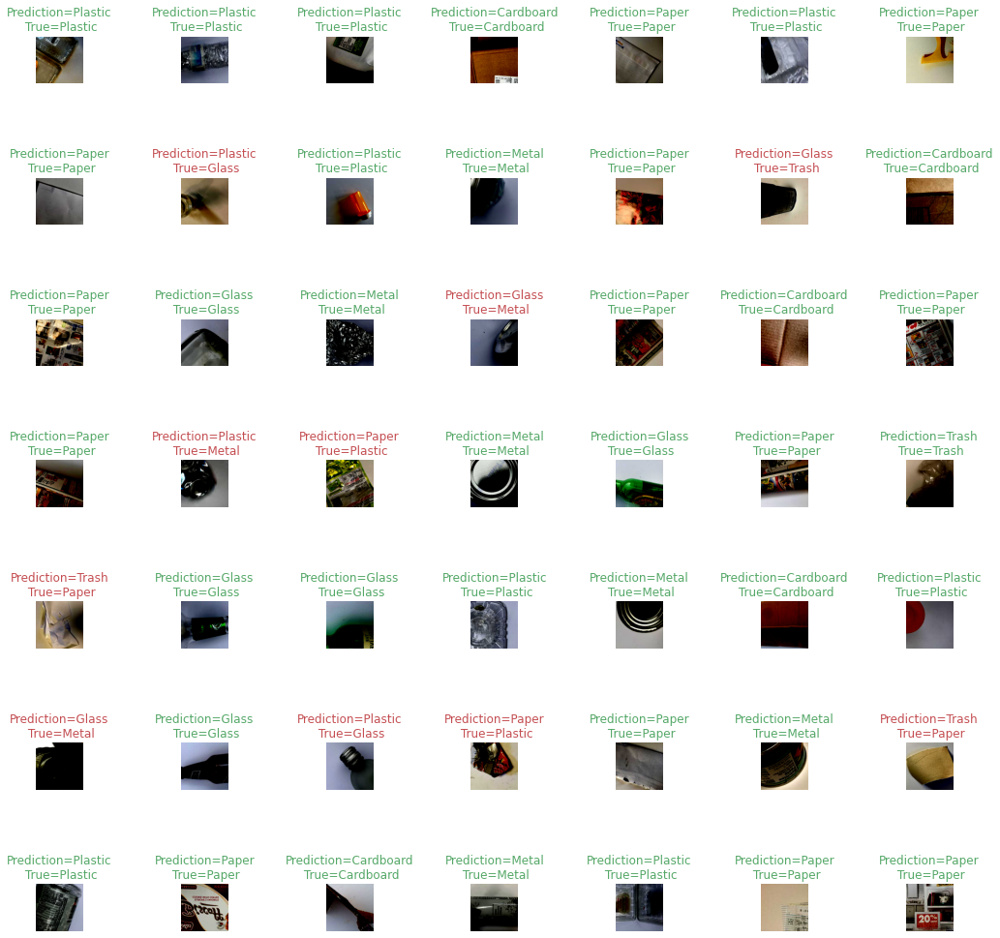

In [ ]:
#plot the image from the test dataset, the predicted garbage label, and the actual garbage label

L=7
W=7
fig,axes=plt.subplots(L,W,figsize=(17,17))
axes=axes.ravel()

for i in np.arange(0,L*W):
    axes[i].imshow(X_test[i])
    if pred_class[i] == y_class[i]:
      axes[i].set_title('Prediction={}\n True={}'.format(pred_class[i],y_class[i]), color='C2')
    else: 
      axes[i].set_title('Prediction={}\n True={}'.format(pred_class[i],y_class[i]), color='C3')
    axes[i].axis('off')

plt.subplots_adjust(wspace=2,hspace=2)

####6.3: Evaluate Correct vs. Incorrect Predictions

In [ ]:
corr=0
false=0
for i in range(len(y_test)):
    if y_test[i]==predicted_class[i]:
         corr=corr+1
    else:
        false=false+1
        
print("Correct:",corr)
print("False",false)

Correct: 398
False 120


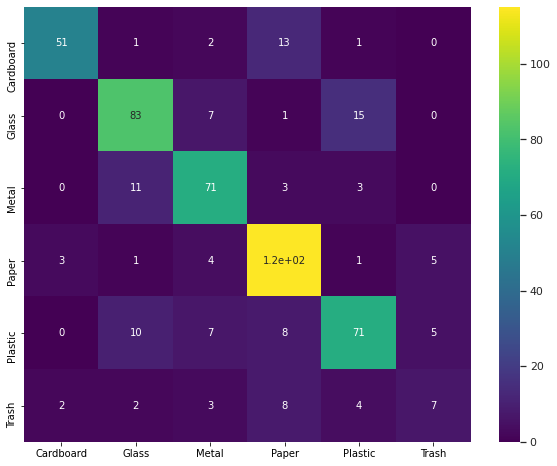

In [ ]:
from sklearn.metrics import confusion_matrix

cm=confusion_matrix(y_class,pred_class)
df_cm = pd.DataFrame(cm, range(cm.shape[0]), range(cm.shape[1]))
df_cm.columns = ['Cardboard','Glass','Metal','Paper','Plastic','Trash']
df_cm.index = ['Cardboard','Glass','Metal','Paper','Plastic','Trash']

fig = plt.subplots(figsize=size_)
sb.set(font_scale=1)
sb.heatmap(df_cm, annot=True, annot_kws={"size": 10}, cmap="viridis") # font size
plt.show()

## Step 7: Input Your Own Data & Generate Prediction

Here, we input a photo we took ourselves, and test our model's performance on it. We can see that the model correctly classified paper post-it that we uploaded. Success!! 


In [ ]:
if not os.path.exists('/content/garbage_classifier/test_images'):
  os.mkdir('/content/garbage_classifier/test_images')

os.chdir(os.path.join(MAIN_DIR, 'test_images'))
with io.capture_output() as captured:
  !wget https://storage.googleapis.com/ai-project-315815-bucket/garbage_images/external_test_images/metal_test.jpeg
  !wget https://storage.googleapis.com/ai-project-315815-bucket/garbage_images/external_test_images/paper_test.jpeg

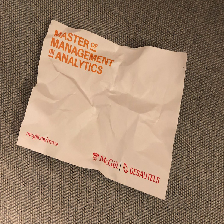

In [ ]:

image_path = '/content/garbage_classifier/test_images/paper_test.jpeg'
image.load_img(image_path, target_size=(224, 224))

In [ ]:
def classify_image(my_image):
  custom_image = image.load_img(my_image, target_size=(224, 224))
  img_array = image.img_to_array(custom_image)
  processed_img = keras.applications.xception.preprocess_input(img_array).astype(np.float32)
  swapped = np.moveaxis(processed_img, 0,1) 
  arr4d = np.expand_dims(swapped, 0)
  new_prediction= class_convert(np.argmax(model.predict(arr4d), axis = -1))
  print('Your item is: ', new_prediction[0])

In [ ]:
classify_image(image_path)

Your item is:  Paper
